In [1]:
from matplotlib import pyplot as plt
import numpy as np
import os
from sklearn.datasets import load_iris
from sklearn.decomposition import PCA


In [57]:
class KMeans:
    """Basic k-means clustering class."""
    def __init__(self, n_clusters=8, max_iter=100, tol=1e-5, normalize=False, p=2):
        """Store clustering algorithm parameters.
        
        Parameters:
            n_clusters (int): How many clusters to compute.
            max_iter (int): The maximum number of iterations to compute.
            tol (float): The convergence tolerance.
        """
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.tol = tol
        self.normalize = normalize        # This is for Problem 3.
        self.p = p                        # this is for problem 2
    
    def fit(self, X, y=None):
        """Compute the cluster centers from random initial conditions.
        
        Parameters:
            X ((n_samples, n_classes) ndarray): the data to be clustered.
        """
        # initialize variables
        m, n = X.shape
        centers = X[np.random.choice(m, self.n_clusters, replace=False)]    # get centers
        self.cluster_centers = centers
        self.labels = np.zeros(m, dtype=int)
        old_centers = np.zeros((self.n_clusters, n))    # cluster centers from prev iter
        
        for i in range(self.max_iter):
            # calculate distance between each point and each cluster center
            dist = np.array([np.linalg.norm(X - center, axis=1, ord=self.p) for center in centers])

            # update the labels & then update the cluster centers
            self.labels = np.argmin(dist, axis=0)
            centers_old = centers.copy()

            for j in range(self.n_clusters):
                centers[j] = np.mean(X[self.labels == j], axis=0)

            # check 4 convergence.
            if np.linalg.norm(centers - centers_old, ord=self.p) < self.tol:
                break
                
            # normalize! the cluster centers.
            if self.normalize:
                denom = np.linalg.norm(centers, axis=1, ord=self.p).reshape(-1, 1)
                centers = centers / denom
                
        # save final cluster centers
        self.cluster_centers = centers
        return self
    
    def predict(self, X):
        """Classify each entry of X based on which cluster center it belongs to.

        Parameters:
            X ((n_samples, n_classes) ndarray): the data to be clustered.
        
        Returns:
            ((n_samples) ndarray): Integer labels from 0 to n_clusters for each entry of X.
        """
        l, n = X.shape                  # number of samples & features

        # compute distance to each cluster center
        dist = np.array([np.linalg.norm(X - center, axis=1, ord=self.p) for center in self.cluster_centers])
        
        # return nearest cluster
        return np.argmin(dist, axis=0)

    
    def fit_predict(self, X):
        """Fit to the data and return the resulting labels.

        Parameters:
            X ((n_samples, n_classes) ndarray): the data to be clustered.
        """
        return self.fit(X).predict(X)
    
    def plot(self, X, y, title='K-Means', x_lab='x', y_lab='y'):
        """Plot each of the data points, colored by cluster.
        Plot each of the cluster centers using a different marker.

        Parameters:
            X ((n_samples, n_classes) ndarray): the data being clustered.
            y ((n_samples) ndarray): the labels for each of the samples.
        """
        l, n = X.shape                  # number of samples & features
        
        # plot data, color by cluster
        for i in range(self.n_clusters):
            plt.plot(X[y == i, 0], X[y == i, 1], '.', label=f"Cluster {i}")
            
        # plot the cluster centers
        plt.plot(self.cluster_centers[:, 0], self.cluster_centers[:, 1], '*', c='black',label="Cluster Center")
        plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
        plt.title(title)
        plt.xlabel(x_lab)
        plt.ylabel(y_lab)
        plt.tight_layout()
        plt.show()

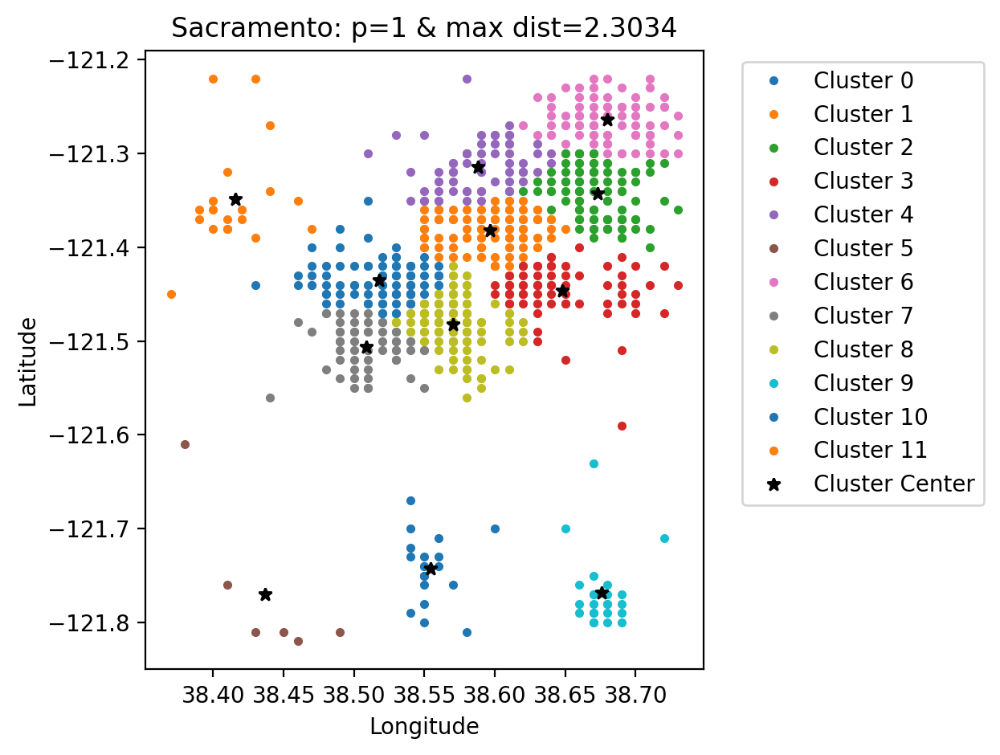

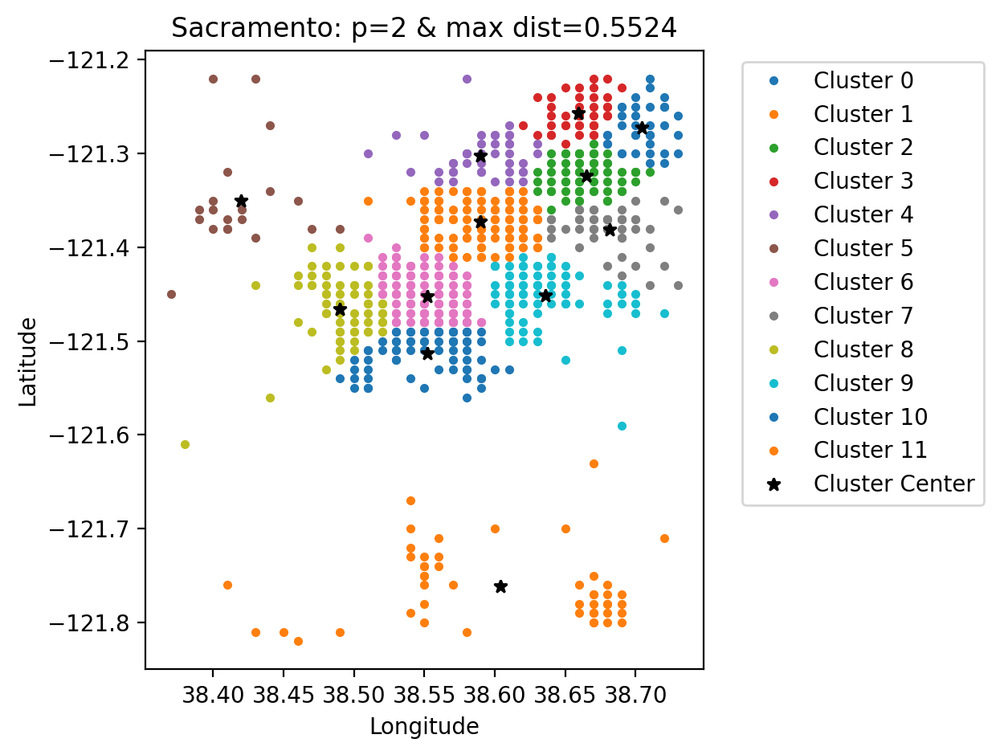

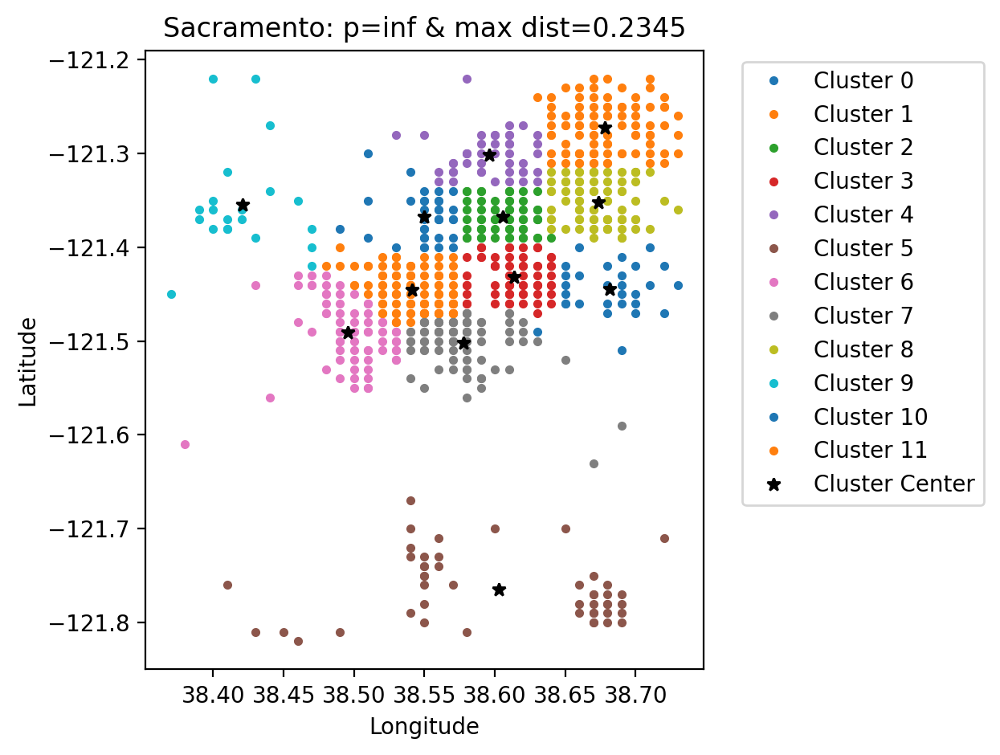

In [52]:
def prob2():
    # load data: columns= median block income, median house age in the block, average number of rooms, average number of bedrooms, average house occupancy, latitude and longitude.
    sacramento = np.load("sacramento.npy")
    data = sacramento[:,6:]

    # cluster for each norm
    for p in [1, 2, np.inf]:
        # fit & predict
        kmeans = KMeans(n_clusters=12, p=p)
        kmeans.fit(data)
        y = kmeans.predict(data)

        # find max dist
        max_distance = np.max([np.linalg.norm(data[y == i] - kmeans.cluster_centers[i], ord=p) for i in range(12)])

        # plot
        kmeans.plot(data, y, title=f'Sacramento: p={p} & max dist={round(max_distance, 4)}', x_lab='Longitude', y_lab='Latitude')

prob2()

The best norm for keeping the maximum distance small is the inf norm.

## Problem 3

Modify `KMeans.fit()` so that if `normalize` is `True`, the cluster centers are normalized at each iteration.

Cluster the earthquake data in three dimensions by converting the data from spherical coordinates to euclidean coordinates on the sphere.
1. Convert longitude and latitude to radians, then to spherical coordinates.
(Hint: `np.deg2rad()` may be helpful.)
2. Convert the spherical coordinates to euclidean coordinates in $\mathbb{R}^3$.
3. Use your `KMeans` class with normalization to cluster the euclidean coordinates.
4. Translate the cluster center coordinates back to spherical coordinates, then to degrees.
5. Plot the data, coloring by cluster.
Also mark the cluster centers.

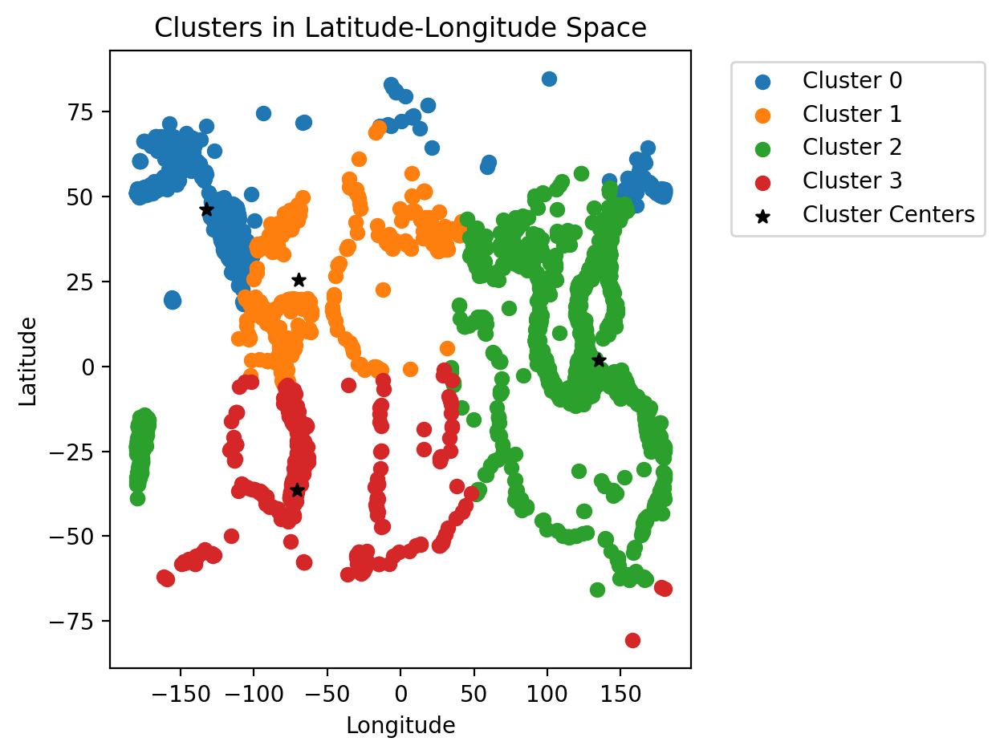

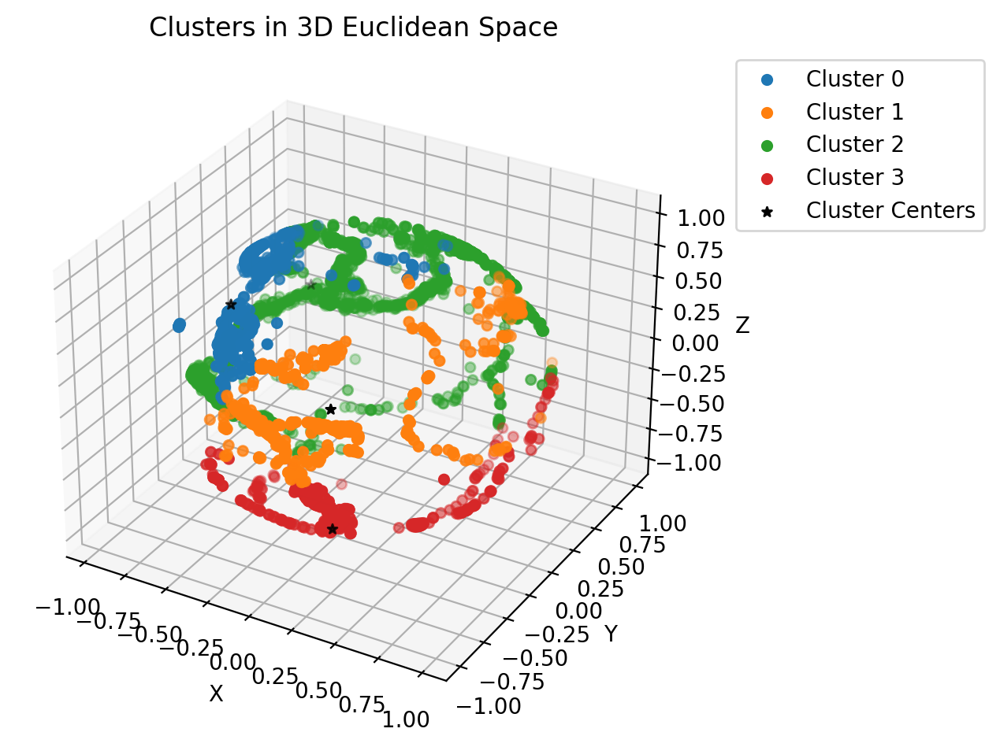

In [53]:
def prob3():
    # load data
    earthquake = np.load("earthquake_coordinates.npy")

    # 1. Convert longitude and latitude to radians, then to spherical coordinates.
    lon_r = np.deg2rad(earthquake[:, 0])
    lat_r = np.deg2rad(earthquake[:, 1])

    r = np.ones(lon_r.shape)
    theta = lon_r
    phi = np.pi / 2 - lat_r

    # 2. Convert the spherical coordinates to euclidean coordinates in R3.
    #spherical_coords = np.column_stack((r, theta, phi))
    x = r * np.sin(phi) * np.cos(theta)
    y = r * np.sin(phi) * np.sin(theta)
    z = r * np.cos(phi)

    euclidean_coords = np.column_stack((x, y, z))

    # 3. Use your KMeans class with normalization to cluster the euclidean coordinates.
    kmeans = KMeans(n_clusters=4, normalize=True)
    labels = kmeans.fit_predict(euclidean_coords)   # fit model

    # Translate the cluster center coordinates back to spherical coordinates, then to 
    # degrees. Transform the cluster means back to latitude and longitude coordinates.

    cluster_centers_sphere = np.zeros((kmeans.n_clusters, 3))

    for i, center in enumerate(kmeans.cluster_centers):
        x, y, z = center
        r = np.sqrt(x**2 + y**2 + z**2)
        theta, phi = np.arctan2(y, x), np.arccos(z/r)
        cluster_centers_sphere[i] = [r, theta, phi]

    cluster_centers_deg = np.zeros((kmeans.n_clusters, 2))

    for i, (_, theta, phi) in enumerate(cluster_centers_sphere):
        lon_deg = np.rad2deg(theta)
        lat_deg = 90 - np.rad2deg(phi)
        cluster_centers_deg[i] = [lon_deg, lat_deg]

    # Plot

    #plt.figure(figsize=(12, 6))

    for i in range(kmeans.n_clusters):
        plt.scatter(earthquake[labels == i, 0], earthquake[labels == i, 1], label=f"Cluster {i}")
    
    plt.scatter(cluster_centers_deg[:, 0], cluster_centers_deg[:, 1], c='black', marker='*', label='Cluster Centers')
    plt.title("Clusters in Latitude-Longitude Space")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Plot in 3D Euclidean space
    ax = plt.subplot(1, 1, 1, projection='3d')
    for i in range(kmeans.n_clusters):
        ax.scatter(euclidean_coords[labels == i, 0], euclidean_coords[labels == i, 1], euclidean_coords[labels == i, 2], label=f"Cluster {i}")
    
    ax.scatter(kmeans.cluster_centers[:, 0], kmeans.cluster_centers[:, 1], kmeans.cluster_centers[:, 2], c='black', marker='*', label='Cluster Centers')
    ax.set_title("Clusters in 3D Euclidean Space")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
    plt.tight_layout()
    plt.show()
prob3()

## Problem 4

Write a function that accepts an image array (of shape $(m,n,3)$), an integer number of clusters $k$, and an integer number of samples $S$.
Reshape the image so that each row represents a single pixel.
Choose $S$ pixels to train a $k$-means model on with $k$ clusters.
Make a copy of the original picture where each pixel has the same color as its cluster center.
Return the new image.
For this problem, you may use `sklearn.cluster.KMeans` instead of your `KMeans` class.

Test your function on some of the provided NASA images.

In [54]:
def quantize_image(im, n_clusters=4, n_samples=50):
    """Cluster the pixels of the image 'im' by color.
    Return a copy of the image where each pixel is replaced by the value
    of its cluster center.
    
    Parameters:
        im ((m,n,3) ndarray): an image array.
        n_clusters (int): the number of k-means clusters.
        n_samples (int): the number of pixels to train the k-means model on.
    
    Returns:
        ((m,n,3) ndarray): the quantized image.
    """
    # Reshape the image so that each row represents a single pixel
    m, n, _ = im.shape
    reshaped = im.reshape(-1, 3)

    # Choose S pixels to train a k-means model on with k clusters.
    pixels = reshaped[np.random.choice(reshaped.shape[0], n_samples, replace=False)]
    kmeans = KMeans(n_clusters)
    kmeans.fit(pixels)
    labels = kmeans.predict(reshaped)
    new = kmeans.cluster_centers[labels].reshape(m, n, 3).astype('uint8')

    return new

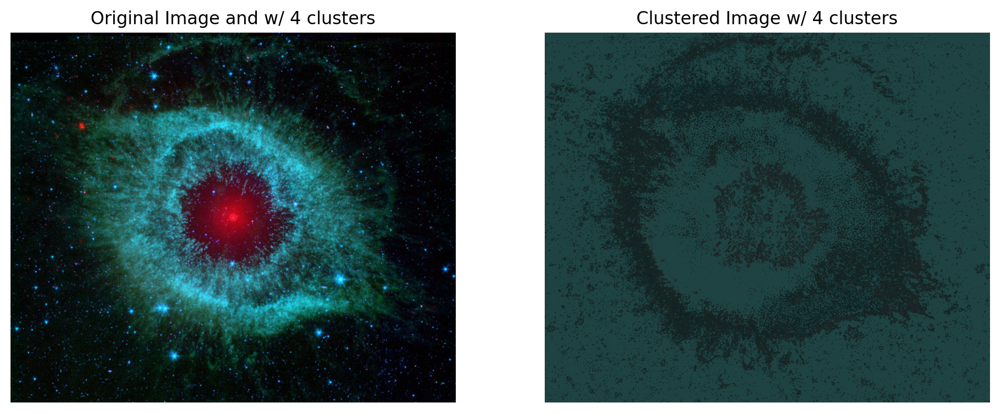

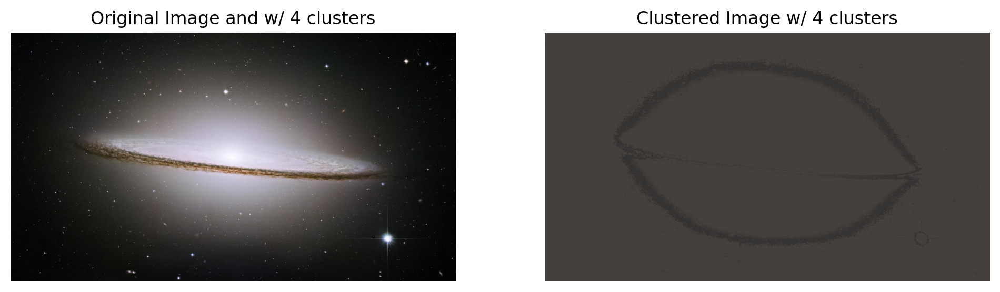

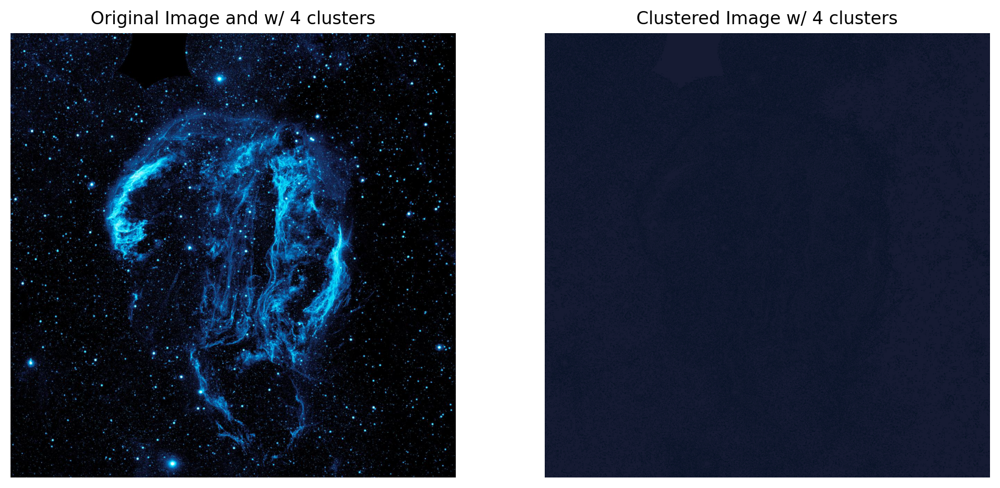

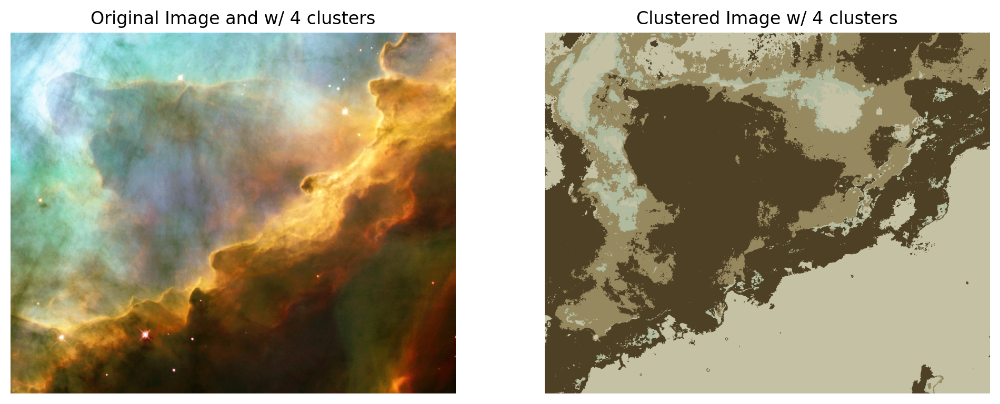

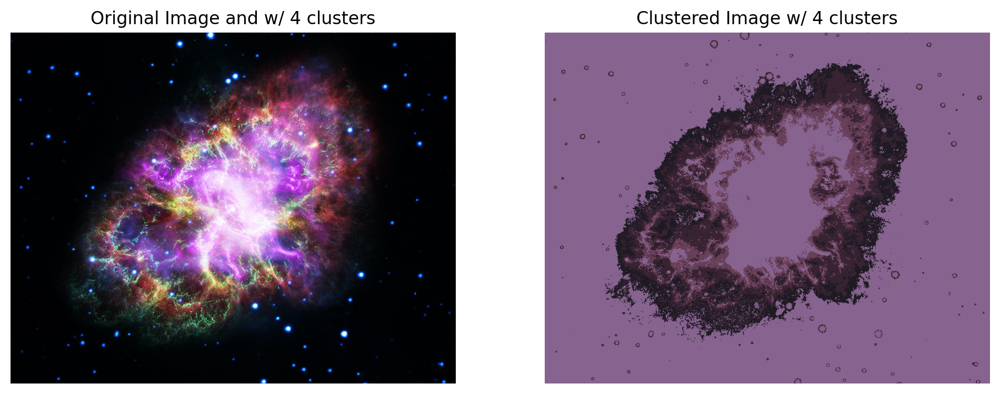

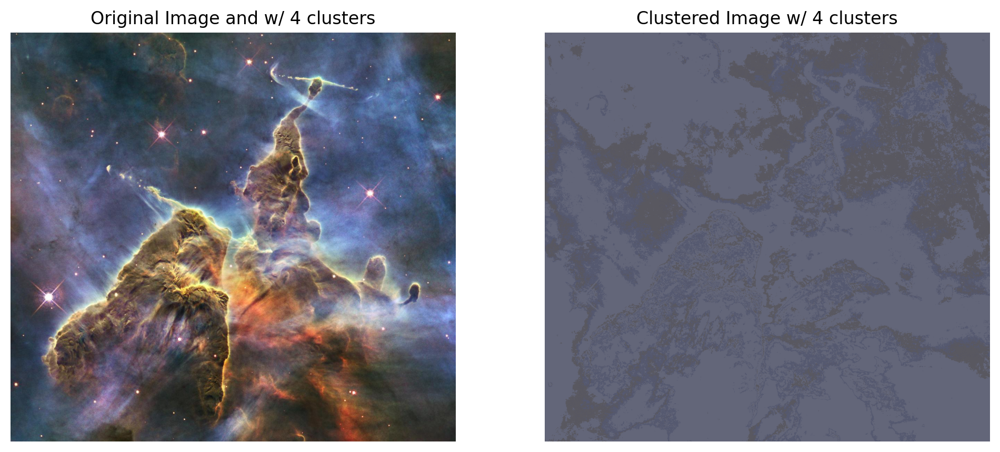

In [58]:

# loop through each nasa img

for image_name in os.listdir("nasa"):
    # find image
    image = plt.imread("nasa/" + image_name)
    clustered = quantize_image(image,  n_samples=1000)
    
    # plot
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image and w/ 4 clusters")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(clustered)
    plt.title("Clustered Image w/ 4 clusters")
    plt.axis('off')
    
    plt.show()